# Correlaciones entre los datos

Este notebook contiene las pruebas y el trabajo realizado en el tema de correlaciones del TFM.

Las funciones de Pearson y Spearman definidas han sido guardadas en el archivo `corr_pvalue.py` y son usadas en el notebook `correlacion80.ipynb`. Estas se generaron porque las funciones predefinidas de la librería `scipy` no los podíamos usar a solas para implementar el criterio en nuestros mapas de calor.

## Datos

In [1]:
# Permite ajustar la anchura de la parte útil de la libreta (reduce los márgenes)
from IPython.display import display, HTML
display(HTML("<style>.container{ width:98% }</style>"))

import numpy as np
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
import re
import os

%config InlineBackend.figure_format = "retina"

In [2]:
df_data = pd.read_csv('data.csv')

# Correlación de Pearson

In [3]:
from scipy.stats import pearsonr

corr_p = {'X':[],'Y':[],'Coef':[],'pvalue':[]}

for i in df_data.columns[1:-2]:
    for j in df_data.columns[1:-2]:
        # Calcular la corr_pelación de Pearson
        correlation_coefficient, p_value = pearsonr(df_data[i], df_data[j])
        corr_p['X']+=[i]
        corr_p['Y']+=[j]
        corr_p['Coef']+=[correlation_coefficient]
        corr_p['pvalue']+=[p_value]

df_corr_p = pd.DataFrame(corr_p)
display(df_corr_p)

,X,Y,Coef,pvalue
0,capacity,capacity,1.000000,0.000000e+00
1,capacity,SOC,-0.057718,5.347172e-01
2,capacity,maxTemp,0.019563,8.334566e-01
3,capacity,tempIncreaseRate,0.365946,4.598238e-05
4,capacity,initialVoltage,-0.550045,1.106779e-10
...,...,...,...,...
116,OHS,finalVoltageChange,0.381898,1.979376e-05
117,OHS,voltageDrop2,0.293663,1.248754e-03
118,OHS,voltageDrop5,0.275279,2.553106e-03
119,OHS,voltageDropScore,0.363297,5.266812e-05


In [4]:
np.unique(df_corr_p.X)

array(['OHS', 'SOC', 'capacity', 'finalVoltageChange', 'initialVoltage',
       'maxTemp', 'tempIncreaseRate', 'voltageDrop2', 'voltageDrop5',
       'voltageDropScore', 'voltageRange'], dtype=object)

In [5]:
df_corr_p[df_corr_p['X']=='initialVoltage']

,X,Y,Coef,pvalue
44,initialVoltage,capacity,-0.550045,1.106779e-10
45,initialVoltage,SOC,0.618599,8.352984e-14
46,initialVoltage,maxTemp,0.209481,2.280749e-02
47,initialVoltage,tempIncreaseRate,0.225851,1.392819e-02
48,initialVoltage,initialVoltage,1.000000,0.000000e+00
49,initialVoltage,voltageRange,0.489801,1.811798e-08
50,initialVoltage,finalVoltageChange,0.477805,4.466266e-08
51,initialVoltage,voltageDrop2,-0.495932,1.127134e-08
52,initialVoltage,voltageDrop5,-0.371789,3.394222e-05
53,initialVoltage,voltageDropScore,0.378121,2.426284e-05


## Filtramos los que no tienen p-valor menor que 0.05 y las correlaciones de una variable consigo misma

In [6]:
# Filtrar las filas con p-value menor que 0.05
df_filtered_pearson = df_corr_p[df_corr_p['pvalue'] < 0.05]
df_filtered_pearson = df_filtered_pearson[df_filtered_pearson['X']!=df_filtered_pearson['Y']]
display(df_filtered_pearson[:11])

,X,Y,Coef,pvalue
3,capacity,tempIncreaseRate,0.365946,4.598238e-05
4,capacity,initialVoltage,-0.550045,1.106779e-10
5,capacity,voltageRange,-0.541474,2.433087e-10
6,capacity,finalVoltageChange,-0.550834,1.028192e-10
7,capacity,voltageDrop2,0.810530,1.018923e-28
8,capacity,voltageDrop5,0.535611,4.117890e-10
9,capacity,voltageDropScore,-0.521273,1.430375e-09
10,capacity,OHS,0.373237,3.145190e-05
15,SOC,initialVoltage,0.618599,8.352984e-14
25,maxTemp,tempIncreaseRate,0.658038,5.662623e-16


# Correlación de Spearman

In [7]:
import pandas as pd
from scipy.stats import spearmanr

corr_s = {'X': [], 'Y': [], 'Coef': [], 'pvalue': []}

for i in df_data.columns[1:-2]:
    for j in df_data.columns[1:-2]:
        # Calcular la correlación de Spearman
        correlation_coefficient, p_value = spearmanr(df_data[i], df_data[j])
        corr_s['X'].append(i)
        corr_s['Y'].append(j)
        corr_s['Coef'].append(correlation_coefficient)
        corr_s['pvalue'].append(p_value)

df_corr_s = pd.DataFrame(corr_s)

In [8]:
df_corr_s.X

0      capacity
1      capacity
2      capacity
3      capacity
4      capacity
         ...   
116         OHS
117         OHS
118         OHS
119         OHS
120         OHS
Name: X, Length: 121, dtype: object

In [9]:
df_corr_s[df_corr_s['X']=='capacity']

,X,Y,Coef,pvalue
0,capacity,capacity,1.000000,0.000000e+00
1,capacity,SOC,-0.067090,4.703946e-01
2,capacity,maxTemp,-0.000413,9.964624e-01
3,capacity,tempIncreaseRate,0.485755,2.465858e-08
4,capacity,initialVoltage,-0.505534,5.258550e-09
5,capacity,voltageRange,-0.420008,2.193300e-06
6,capacity,finalVoltageChange,-0.395791,9.157622e-06
7,capacity,voltageDrop2,0.880126,2.466290e-39
8,capacity,voltageDrop5,0.851565,2.532863e-34
9,capacity,voltageDropScore,-0.464431,1.173398e-07


## Filtramos los que no tienen p-valor menor que 0.05 y las correlaciones de una variable consigo misma

In [10]:
df_filtered_spearman = df_corr_s[df_corr_s['pvalue'] < 0.05]
df_filtered_spearman = df_filtered_spearman[df_filtered_spearman['X']!=df_filtered_spearman['Y']]
display(df_filtered_spearman)

,X,Y,Coef,pvalue
3,capacity,tempIncreaseRate,0.485755,2.465858e-08
4,capacity,initialVoltage,-0.505534,5.258550e-09
5,capacity,voltageRange,-0.420008,2.193300e-06
6,capacity,finalVoltageChange,-0.395791,9.157622e-06
7,capacity,voltageDrop2,0.880126,2.466290e-39
...,...,...,...,...
115,OHS,voltageRange,0.381092,2.067682e-05
116,OHS,finalVoltageChange,0.408819,4.304088e-06
117,OHS,voltageDrop2,0.433896,9.177680e-07
118,OHS,voltageDrop5,0.453566,2.496429e-07


# *Por curiosidad: Veamos qué coeficientes son |c|>=0.5*

## Pearson

In [11]:
df_filtered_pearson.sort_values(by='Coef', ascending=False)[::2]

,X,Y,Coef,pvalue
61,voltageRange,finalVoltageChange,0.989495,2.768380e-99
75,finalVoltageChange,voltageDropScore,0.979082,4.598246e-82
64,voltageRange,voltageDropScore,0.963989,1.445211e-68
112,OHS,maxTemp,0.815043,2.892851e-29
113,OHS,tempIncreaseRate,0.812233,6.360699e-29
77,voltageDrop2,capacity,0.810530,1.018923e-28
31,maxTemp,voltageDropScore,0.708018,3.092999e-19
57,voltageRange,maxTemp,0.693731,3.094899e-18
28,maxTemp,finalVoltageChange,0.692735,3.616171e-18
35,tempIncreaseRate,maxTemp,0.658038,5.662623e-16


In [12]:
df_pearson_top = df_filtered_pearson[abs(df_filtered_pearson['Coef'])>0.5]
df_pearson_top = df_pearson_top.sort_values(by='Coef', ascending=False)
df_pearson_top[::2]

,X,Y,Coef,pvalue
61,voltageRange,finalVoltageChange,0.989495,2.768380e-99
105,voltageDropScore,finalVoltageChange,0.979082,4.598246e-82
104,voltageDropScore,voltageRange,0.963989,1.445211e-68
112,OHS,maxTemp,0.815043,2.892851e-29
113,OHS,tempIncreaseRate,0.812233,6.360699e-29
7,capacity,voltageDrop2,0.810530,1.018923e-28
101,voltageDropScore,maxTemp,0.708018,3.092999e-19
57,voltageRange,maxTemp,0.693731,3.094899e-18
68,finalVoltageChange,maxTemp,0.692735,3.616171e-18
25,maxTemp,tempIncreaseRate,0.658038,5.662623e-16


### Organizamos las tablas para ver mejor la info

#### Pearson

In [13]:
df_pearson_top[df_pearson_top.X == 'finalVoltageChange']

,X,Y,Coef,pvalue
71,finalVoltageChange,voltageRange,0.989495,2.768380e-99
75,finalVoltageChange,voltageDropScore,0.979082,4.598246e-82
68,finalVoltageChange,maxTemp,0.692735,3.616171e-18
66,finalVoltageChange,capacity,-0.550834,1.028192e-10


In [14]:
df_pearson_top[df_pearson_top.X == 'voltageRange']

,X,Y,Coef,pvalue
61,voltageRange,finalVoltageChange,0.989495,2.768380e-99
64,voltageRange,voltageDropScore,0.963989,1.445211e-68
57,voltageRange,maxTemp,0.693731,3.094899e-18
55,voltageRange,capacity,-0.541474,2.433087e-10


In [15]:
df_pearson_top[df_pearson_top.X == 'voltageDropScore']

,X,Y,Coef,pvalue
105,voltageDropScore,finalVoltageChange,0.979082,4.598246e-82
104,voltageDropScore,voltageRange,0.963989,1.445211e-68
101,voltageDropScore,maxTemp,0.708018,3.092999e-19
99,voltageDropScore,capacity,-0.521273,1.430375e-09


In [16]:
df_pearson_top[df_pearson_top.X == 'capacity']

,X,Y,Coef,pvalue
7,capacity,voltageDrop2,0.810530,1.018923e-28
8,capacity,voltageDrop5,0.535611,4.117890e-10
9,capacity,voltageDropScore,-0.521273,1.430375e-09
5,capacity,voltageRange,-0.541474,2.433087e-10
4,capacity,initialVoltage,-0.550045,1.106779e-10
6,capacity,finalVoltageChange,-0.550834,1.028192e-10


In [17]:
df_pearson_top[df_pearson_top.X == 'maxTemp']

,X,Y,Coef,pvalue
32,maxTemp,OHS,0.815043,2.892851e-29
31,maxTemp,voltageDropScore,0.708018,3.092999e-19
27,maxTemp,voltageRange,0.693731,3.094899e-18
28,maxTemp,finalVoltageChange,0.692735,3.616171e-18
25,maxTemp,tempIncreaseRate,0.658038,5.662623e-16


In [18]:
df_pearson_top[df_pearson_top.X == 'voltageDrop2']

,X,Y,Coef,pvalue
77,voltageDrop2,capacity,0.810530,1.018923e-28
85,voltageDrop2,voltageDrop5,0.552777,8.569762e-11


In [19]:
df_pearson_top[df_pearson_top.X == 'voltageDrop5']

,X,Y,Coef,pvalue
95,voltageDrop5,voltageDrop2,0.552777,8.569762e-11
88,voltageDrop5,capacity,0.535611,4.117890e-10


In [20]:
df_pearson_top[df_pearson_top.X == 'initialVoltage']

,X,Y,Coef,pvalue
45,initialVoltage,SOC,0.618599,8.352984e-14
44,initialVoltage,capacity,-0.550045,1.106779e-10


#### Spearman

In [21]:
df_filtered_spearman.sort_values(by='Coef', ascending=False)[::2]

,X,Y,Coef,pvalue
61,voltageRange,finalVoltageChange,0.993103,7.712203e-110
7,capacity,voltageDrop2,0.880126,2.466290e-39
95,voltageDrop5,voltageDrop2,0.878679,4.738177e-39
8,capacity,voltageDrop5,0.851565,2.532863e-34
113,OHS,tempIncreaseRate,0.839103,1.863711e-32
105,voltageDropScore,finalVoltageChange,0.829346,4.209639e-31
104,voltageDropScore,voltageRange,0.829334,4.225445e-31
101,voltageDropScore,maxTemp,0.743222,5.591298e-22
25,maxTemp,tempIncreaseRate,0.737417,1.698110e-21
28,maxTemp,finalVoltageChange,0.703255,6.767678e-19


In [22]:
df_spearman_top = df_filtered_spearman[abs(df_filtered_spearman['Coef'])>0.5]
df_spearman_top = df_spearman_top.sort_values(by='Coef', ascending=False)
df_spearman_top[::2]

,X,Y,Coef,pvalue
61,voltageRange,finalVoltageChange,0.993103,7.712203e-110
77,voltageDrop2,capacity,0.880126,2.466290e-39
95,voltageDrop5,voltageDrop2,0.878679,4.738177e-39
88,voltageDrop5,capacity,0.851565,2.532863e-34
43,tempIncreaseRate,OHS,0.839103,1.863711e-32
105,voltageDropScore,finalVoltageChange,0.829346,4.209639e-31
104,voltageDropScore,voltageRange,0.829334,4.225445e-31
101,voltageDropScore,maxTemp,0.743222,5.591298e-22
35,tempIncreaseRate,maxTemp,0.737417,1.698110e-21
28,maxTemp,finalVoltageChange,0.703255,6.767678e-19


In [23]:
df_spearman_top[df_spearman_top.X == 'finalVoltageChange']

,X,Y,Coef,pvalue
71,finalVoltageChange,voltageRange,0.993103,7.712203e-110
75,finalVoltageChange,voltageDropScore,0.829346,4.209639e-31
68,finalVoltageChange,maxTemp,0.703255,6.767678e-19
70,finalVoltageChange,initialVoltage,0.574691,1.010064e-11


In [24]:
df_spearman_top[df_spearman_top.X == 'voltageRange']

,X,Y,Coef,pvalue
61,voltageRange,finalVoltageChange,0.993103,7.712203e-110
64,voltageRange,voltageDropScore,0.829334,4.225445e-31
57,voltageRange,maxTemp,0.680459,2.339733e-17
59,voltageRange,initialVoltage,0.579644,6.093012e-12


In [25]:
df_spearman_top[df_spearman_top.X == 'voltageDropScore']

,X,Y,Coef,pvalue
105,voltageDropScore,finalVoltageChange,0.829346,4.209639e-31
104,voltageDropScore,voltageRange,0.829334,4.225445e-31
101,voltageDropScore,maxTemp,0.743222,5.591298e-22


In [26]:
df_spearman_top[df_spearman_top.X == 'capacity']

,X,Y,Coef,pvalue
7,capacity,voltageDrop2,0.880126,2.466290e-39
8,capacity,voltageDrop5,0.851565,2.532863e-34
4,capacity,initialVoltage,-0.505534,5.258550e-09


In [27]:
df_spearman_top[df_spearman_top.X == 'maxTemp']

,X,Y,Coef,pvalue
31,maxTemp,voltageDropScore,0.743222,5.591298e-22
25,maxTemp,tempIncreaseRate,0.737417,1.698110e-21
28,maxTemp,finalVoltageChange,0.703255,6.767678e-19
32,maxTemp,OHS,0.695121,2.488113e-18
27,maxTemp,voltageRange,0.680459,2.339733e-17


In [28]:
df_spearman_top[df_spearman_top.X == 'voltageDrop2']

,X,Y,Coef,pvalue
77,voltageDrop2,capacity,0.880126,2.466290e-39
85,voltageDrop2,voltageDrop5,0.878679,4.738177e-39


In [29]:
df_spearman_top[df_spearman_top.X == 'voltageDrop5']

,X,Y,Coef,pvalue
95,voltageDrop5,voltageDrop2,0.878679,4.738177e-39
88,voltageDrop5,capacity,0.851565,2.532863e-34


In [30]:
df_spearman_top[df_spearman_top.X == 'initialVoltage']

,X,Y,Coef,pvalue
45,initialVoltage,SOC,0.672873,7.094480e-17
49,initialVoltage,voltageRange,0.579644,6.093012e-12
50,initialVoltage,finalVoltageChange,0.574691,1.010064e-11
44,initialVoltage,capacity,-0.505534,5.258550e-09


In [31]:
df_spearman_top[df_spearman_top.X == 'SOC']

,X,Y,Coef,pvalue
15,SOC,initialVoltage,0.672873,7.094480e-17


### Relación negativa

#### Pearson

In [32]:
df_pearson_top = df_filtered_pearson[df_filtered_pearson['Coef']<0]
df_pearson_top.sort_values(by='Coef')

,X,Y,Coef,pvalue
66,finalVoltageChange,capacity,-0.550834,1.028192e-10
6,capacity,finalVoltageChange,-0.550834,1.028192e-10
44,initialVoltage,capacity,-0.550045,1.106779e-10
4,capacity,initialVoltage,-0.550045,1.106779e-10
5,capacity,voltageRange,-0.541474,2.433087e-10
55,voltageRange,capacity,-0.541474,2.433087e-10
99,voltageDropScore,capacity,-0.521273,1.430375e-09
9,capacity,voltageDropScore,-0.521273,1.430375e-09
51,initialVoltage,voltageDrop2,-0.495932,1.127134e-08
81,voltageDrop2,initialVoltage,-0.495932,1.127134e-08


In [33]:
df_spearman_top = df_filtered_spearman[df_filtered_spearman['Coef']<0]
df_spearman_top.sort_values(by='Coef')

,X,Y,Coef,pvalue
4,capacity,initialVoltage,-0.505534,5.258550e-09
44,initialVoltage,capacity,-0.505534,5.258550e-09
52,initialVoltage,voltageDrop5,-0.483631,2.894173e-08
92,voltageDrop5,initialVoltage,-0.483631,2.894173e-08
9,capacity,voltageDropScore,-0.464431,1.173398e-07
99,voltageDropScore,capacity,-0.464431,1.173398e-07
51,initialVoltage,voltageDrop2,-0.448876,3.430617e-07
81,voltageDrop2,initialVoltage,-0.448876,3.430617e-07
5,capacity,voltageRange,-0.420008,2.193300e-06
55,voltageRange,capacity,-0.420008,2.193300e-06


### Guardamos todas las correlaciones en un csv 

In [34]:
data = {
    'X': df_corr_s['X'].values,
    'Y': df_corr_s['Y'].values,
    'Coef_Spearman': df_corr_s['Coef'].values,
    'Coef_Pearson': df_corr_p['Coef'].values
}

df = pd.DataFrame(data)

In [35]:
df

,X,Y,Coef_Spearman,Coef_Pearson
0,capacity,capacity,1.000000,1.000000
1,capacity,SOC,-0.067090,-0.057718
2,capacity,maxTemp,-0.000413,0.019563
3,capacity,tempIncreaseRate,0.485755,0.365946
4,capacity,initialVoltage,-0.505534,-0.550045
...,...,...,...,...
116,OHS,finalVoltageChange,0.408819,0.381898
117,OHS,voltageDrop2,0.433896,0.293663
118,OHS,voltageDrop5,0.453566,0.275279
119,OHS,voltageDropScore,0.327819,0.363297


In [36]:
# Guardar el DataFrame como un archivo CSV
df.to_csv('correlaciones.csv', index=False)

# VISUAL

In [37]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import pearsonr, spearmanr

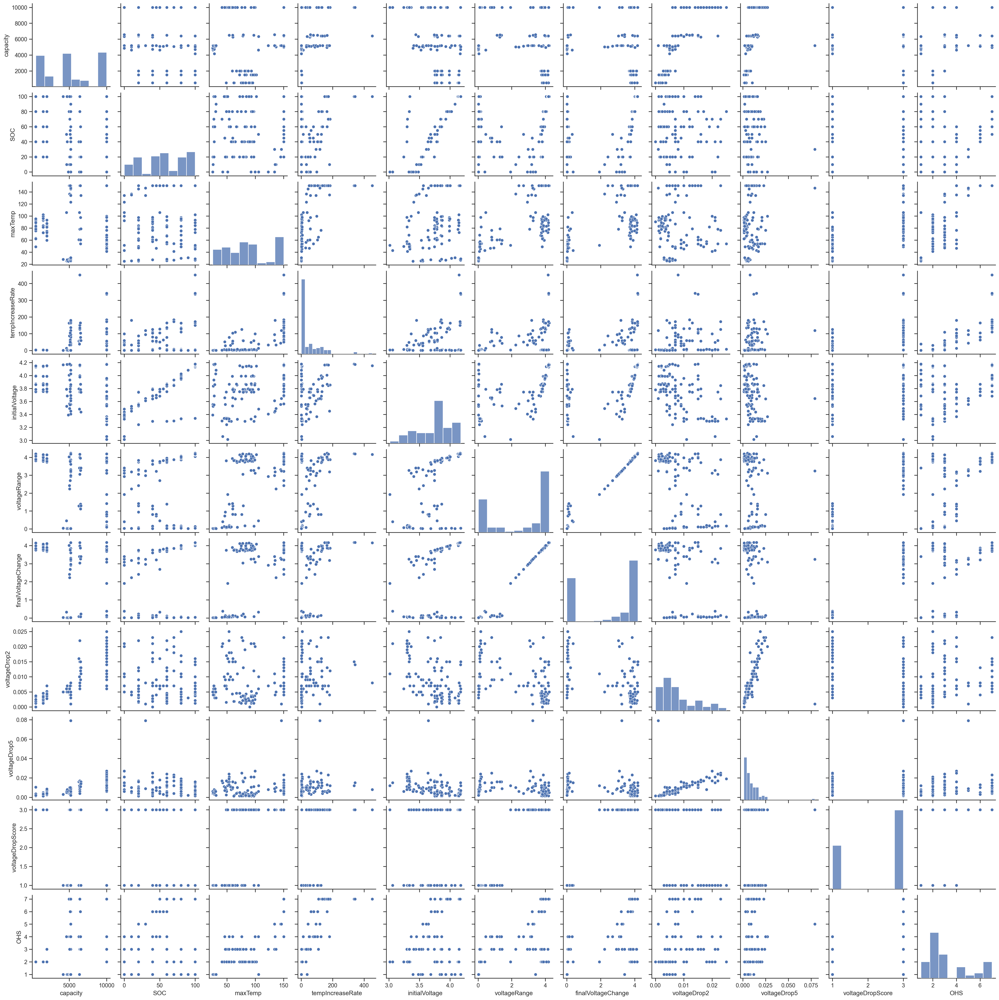

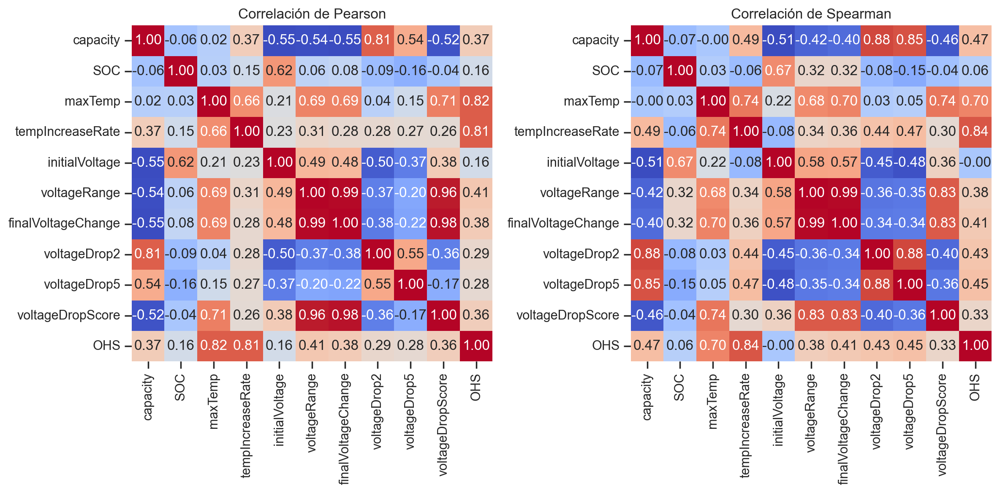

In [38]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import pearsonr, spearmanr

# Obtener las columnas numéricas
numeric_columns = df_data.columns[1:-2]

# Crear la matriz de gráficos de dispersión
sns.set(style="ticks")
sns.pairplot(df_data[numeric_columns])

# Calcular las correlaciones de Pearson y Spearman
corr_pearson = df_data[numeric_columns].corr(method='pearson')
corr_spearman = df_data[numeric_columns].corr(method='spearman')

# Mostrar las matrices de correlación
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
sns.heatmap(corr_pearson, annot=True, cmap='coolwarm', fmt=".2f", cbar=False)
plt.title("Correlación de Pearson")

plt.subplot(1, 2, 2)
sns.heatmap(corr_spearman, annot=True, cmap='coolwarm', fmt=".2f", cbar=False)
plt.title("Correlación de Spearman")

plt.tight_layout()
plt.show()


# CORRELACIONES SEGÚN QUÍMICAS

,battery,capacity,SOC,maxTemp,tempIncreaseRate,initialVoltage,voltageRange,finalVoltageChange,voltageDrop2,voltageDrop5,voltageDropScore,OHS,CHS,chemistry
0,1500mAh1-100S0C,1500,100,92.85700,4.030000,4.142151,4.157715,4.089661,0.001221,0.001221,3,2.0,32.013027,LCO
1,1500mAh1-20S0C,1500,20,83.96100,3.535000,3.747559,3.786621,3.735352,0.001831,0.001831,3,2.0,19.808276,LCO
2,1500mAh1-40S0C,1500,40,92.17600,3.695000,3.785706,3.793030,3.760681,0.001831,0.001526,3,2.0,23.332649,LCO
3,1500mAh1-60S0C,1500,60,93.19600,3.675000,3.858948,3.858643,3.815918,0.001526,0.001221,3,2.0,26.253906,LCO
4,1500mAh1-80S0C,1500,80,93.12700,3.470000,3.988953,3.966064,3.934937,0.001831,0.002136,3,2.0,29.050096,LCO
5,1500mAh2-100S0C,1500,100,93.00800,2.790000,4.137878,4.053040,4.006348,0.003662,0.003967,3,2.0,31.729756,LCO
6,1500mAh2-20S0C,1500,20,72.24900,2.570000,3.751831,3.770752,3.718872,0.001526,0.001526,3,2.0,18.585585,LCO
7,1500mAh2-40S0C,1500,40,81.05600,3.290000,3.785095,3.806152,3.736877,0.002136,0.002136,3,2.0,22.363870,LCO
8,1500mAh2-60S0C,1500,60,99.38200,3.930000,3.872986,3.860474,3.822021,0.002441,0.002747,3,2.0,26.762530,LCO
9,1500mAh2-80S0C,1500,80,97.46800,3.920000,3.988647,3.977661,3.921814,0.001221,0.001221,3,2.0,29.473812,LCO


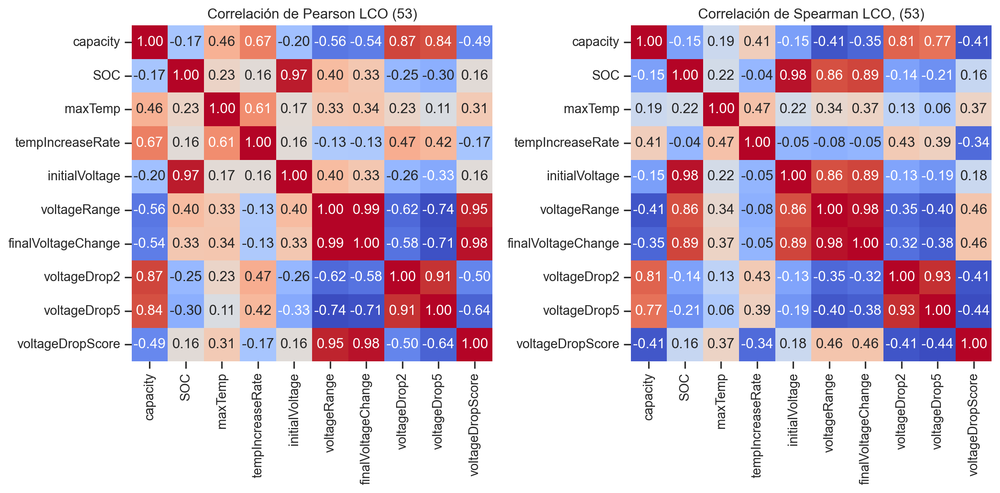

,battery,capacity,SOC,maxTemp,tempIncreaseRate,initialVoltage,voltageRange,finalVoltageChange,voltageDrop2,voltageDrop5,voltageDropScore,OHS,CHS,chemistry
44,LFP10Ah-60SOC-Cell17,10000,60,53.68330,4.200600,3.298,0.150,0.063,0.022,0.024,1,3.0,33.265148,LFP
64,OE-LFP-cell14-60SOC-10Ah,10000,60,56.15605,31.064059,3.295,0.079,0.049,0.010,0.011,1,2.0,39.918083,LFP
65,OE-LFP10Ah-0SOC-cell10,10000,0,42.66866,2.853700,3.061,0.403,0.375,0.021,0.015,1,2.0,12.600613,LFP
66,OE-LFP10Ah-0SOC-cell9,10000,0,51.22772,3.316400,3.015,1.930,1.916,0.011,0.012,3,2.0,13.774688,LFP
67,OE-LFP10Ah-100SOC-cell1,10000,100,48.47368,3.901600,3.343,0.066,0.042,0.007,0.008,1,3.0,45.253525,LFP
68,OE-LFP10Ah-100SOC-cell12,10000,100,51.25121,2.556400,3.340,0.106,0.036,0.016,0.016,1,3.0,45.263584,LFP
69,OE-LFP10Ah-100SOC-cell2,10000,100,45.22361,5.191300,3.342,0.132,0.046,0.010,0.011,1,2.0,45.155721,LFP
70,OE-LFP10Ah-20SOC,10000,20,49.39346,6.407015,3.244,0.076,0.063,0.006,0.006,1,2.0,20.625889,LFP
71,OE-LFP10Ah-40SOC-cell7,10000,40,57.59005,5.410000,3.295,0.116,0.053,0.018,0.008,1,2.0,27.646043,LFP
72,OE-LFP10Ah-40SOC-cell8,10000,40,97.76741,6.154800,3.295,0.157,0.079,0.021,0.021,1,3.0,31.292703,LFP


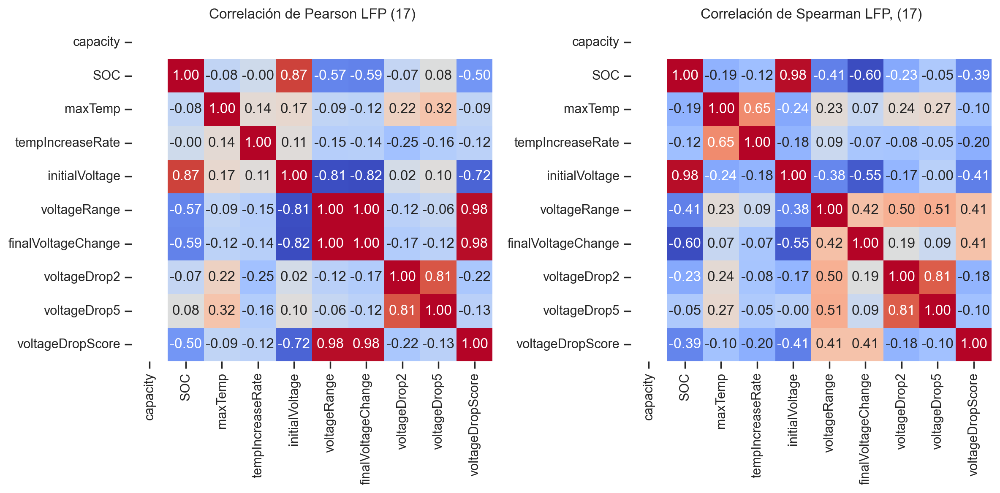

,battery,capacity,SOC,maxTemp,tempIncreaseRate,initialVoltage,voltageRange,finalVoltageChange,voltageDrop2,voltageDrop5,voltageDropScore,OHS,CHS,chemistry
45,OE-10AHr-NMC-40SOC-Cell4,10000,40,64.76552,109.529406,3.641,0.803,0.107,0.015,0.015,1,3.0,53.105112,NMC
46,OE-10Ahr-NMC-0SOC-cell1,10000,0,99.75447,99.001343,3.365,3.115,3.092,0.020,0.027,3,4.0,40.818278,NMC
47,OE-10Ahr-NMC-0SOC-cell2,10000,0,92.37301,48.742537,3.328,3.273,3.255,0.021,0.021,3,3.0,28.346168,NMC
48,OE-10Ahr-NMC-100SOC-cell10,10000,100,150.24270,336.613069,4.177,4.200,4.182,0.015,0.012,3,7.0,100.000000,NMC
49,OE-10Ahr-NMC-100SOC-cell11,10000,100,150.24270,341.900700,4.172,4.193,4.177,0.014,0.015,3,7.0,100.000000,NMC
50,OE-10Ahr-NMC-40SOC-cell1,10000,40,76.32388,125.669552,3.639,0.802,0.140,0.023,0.025,1,4.0,57.996918,NMC
51,OE-10Ahr-NMC-70SOC-cell6,10000,70,150.24270,183.599900,3.855,3.877,3.861,0.012,0.012,3,7.0,100.000000,NMC
52,OE-10Ahr-NMC-70SOC-cell7,10000,70,150.24270,172.236000,3.846,3.876,3.851,0.023,0.023,3,7.0,100.000000,NMC
53,OE-10Ahr-NMC-80SOC-Cell9,10000,80,150.24270,110.909901,3.944,3.967,3.948,0.015,0.012,3,7.0,100.000000,NMC
54,OE-10Ahr-NMC-80SOC-cell8,10000,80,150.24270,130.697313,3.957,3.978,3.963,0.010,0.015,3,7.0,100.000000,NMC


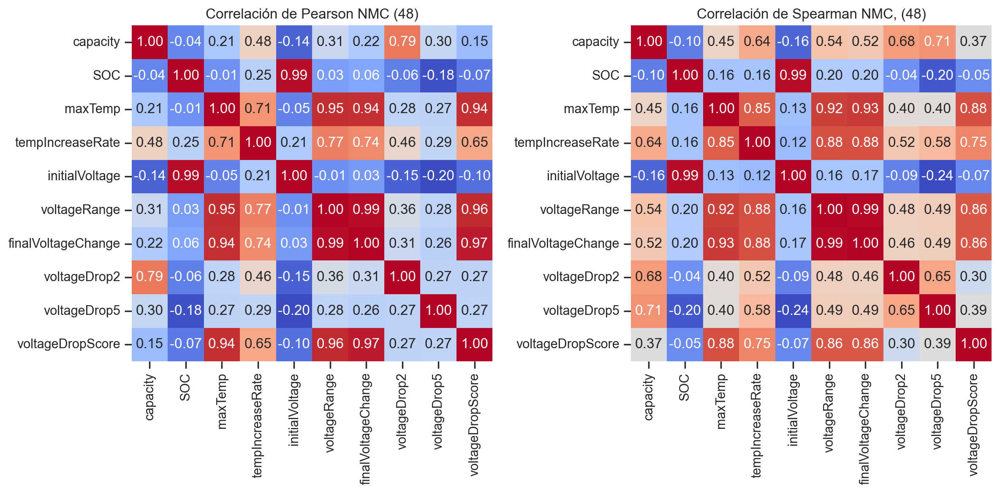

In [39]:
numeric_columns = df_data.columns[1:-3]
for i in np.unique(df_data.chemistry.values):
    bat_quim = df_data[df_data.chemistry==i]
    display(bat_quim)
    # Calcular las correlaciones de Pearson y Spearman
    corr_pearson = bat_quim[numeric_columns].corr(method='pearson')
    corr_spearman = bat_quim[numeric_columns].corr(method='spearman')
    
    # Mostrar las matrices de correlación
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    sns.heatmap(corr_pearson, annot=True, cmap='coolwarm', fmt=".2f", cbar=False)
    plt.title(f"Correlación de Pearson {i} ({len(bat_quim)})")

    plt.subplot(1, 2, 2)
    sns.heatmap(corr_spearman, annot=True, cmap='coolwarm', fmt=".2f", cbar=False)
    plt.title(f"Correlación de Spearman {i}, ({len(bat_quim)})")

    plt.tight_layout()
    plt.show()

In [40]:
df_data.columns[1:-3]

Index(['capacity', 'SOC', 'maxTemp', 'tempIncreaseRate', 'initialVoltage',
       'voltageRange', 'finalVoltageChange', 'voltageDrop2', 'voltageDrop5',
       'voltageDropScore'],
      dtype='object')

In [41]:
bat_quim[bat_quim.columns[1:-3]]

,capacity,SOC,maxTemp,tempIncreaseRate,initialVoltage,voltageRange,finalVoltageChange,voltageDrop2,voltageDrop5,voltageDropScore
45,10000,40,64.76552,109.529406,3.641,0.803,0.107,0.015,0.015,1
46,10000,0,99.75447,99.001343,3.365,3.115,3.092,0.020,0.027,3
47,10000,0,92.37301,48.742537,3.328,3.273,3.255,0.021,0.021,3
48,10000,100,150.24270,336.613069,4.177,4.200,4.182,0.015,0.012,3
49,10000,100,150.24270,341.900700,4.172,4.193,4.177,0.014,0.015,3
50,10000,40,76.32388,125.669552,3.639,0.802,0.140,0.023,0.025,1
51,10000,70,150.24270,183.599900,3.855,3.877,3.861,0.012,0.012,3
52,10000,70,150.24270,172.236000,3.846,3.876,3.851,0.023,0.023,3
53,10000,80,150.24270,110.909901,3.944,3.967,3.948,0.015,0.012,3
54,10000,80,150.24270,130.697313,3.957,3.978,3.963,0.010,0.015,3


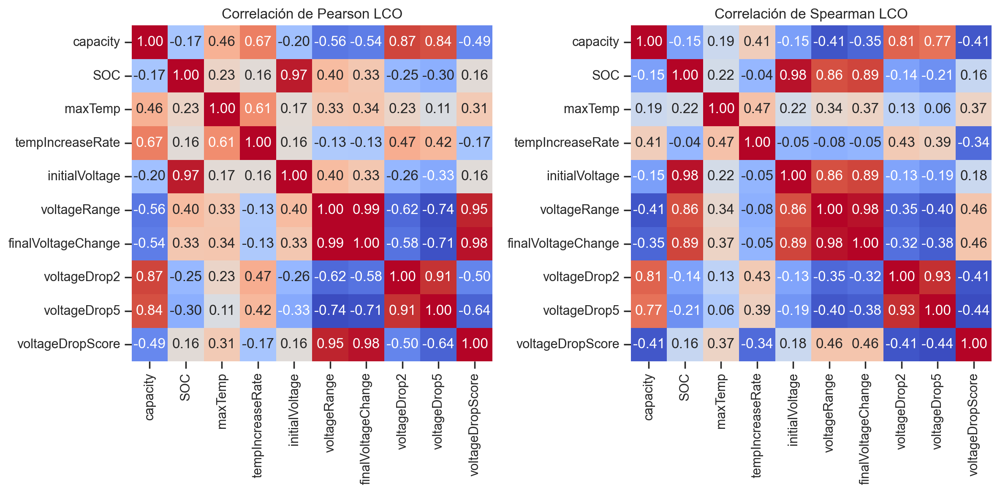

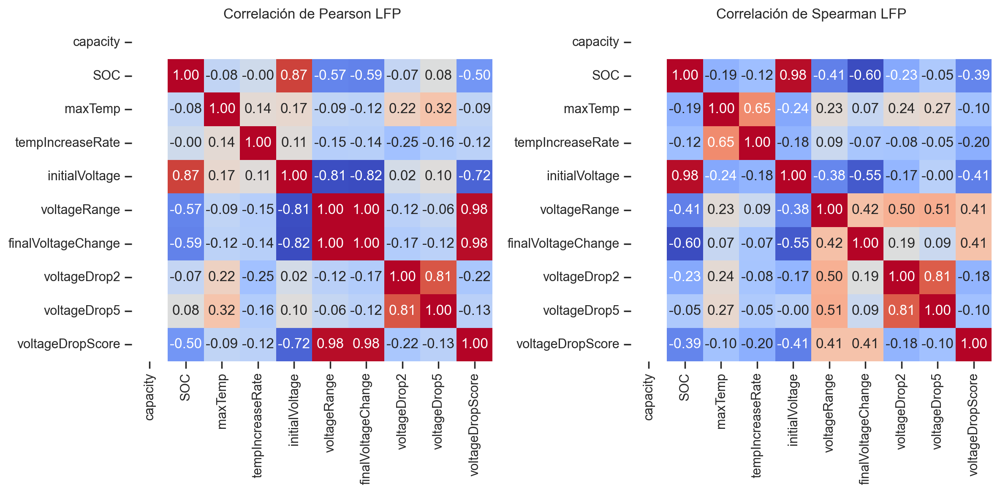

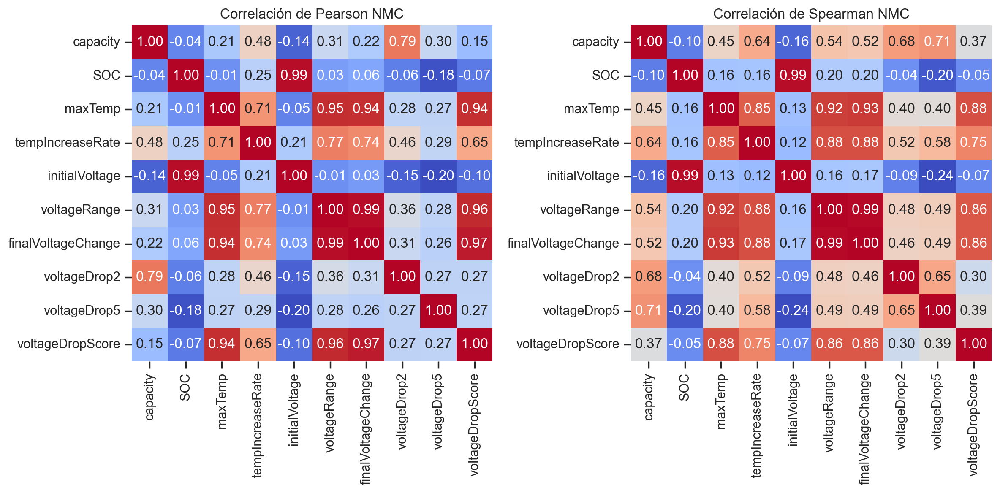

Correlación de Pearson:
                    capacity       SOC   maxTemp  tempIncreaseRate  \
capacity            1.000000 -0.057718  0.019563          0.365946   
SOC                -0.057718  1.000000  0.025337          0.145901   
maxTemp             0.019563  0.025337  1.000000          0.658038   
tempIncreaseRate    0.365946  0.145901  0.658038          1.000000   
initialVoltage     -0.550045  0.618599  0.209481          0.225851   
voltageRange       -0.541474  0.057857  0.693731          0.305337   
finalVoltageChange -0.550834  0.079219  0.692735          0.283949   
voltageDrop2        0.810530 -0.093413  0.040057          0.279540   
voltageDrop5        0.535611 -0.161653  0.145968          0.271381   
voltageDropScore   -0.521273 -0.038355  0.708018          0.261953   

                    initialVoltage  voltageRange  finalVoltageChange  \
capacity                 -0.550045     -0.541474           -0.550834   
SOC                       0.618599      0.057857            0

In [42]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

numeric_columns = df_data.columns[1:-3]

for i in np.unique(df_data.chemistry.values):
    bat_quim = df_data[df_data.chemistry==i]
    
    # display(bat_quim[numeric_columns])
    
    # Calcular las correlaciones de Pearson y Spearman
    corr_pearson = bat_quim[numeric_columns].corr(method='pearson')
    corr_spearman = bat_quim[numeric_columns].corr(method='spearman')
    
    # Crear máscaras para el triángulo inferior
    # mask_pearson = np.triu(np.ones_like(corr_pearson, dtype=bool))
    # mask_spearman = np.triu(np.ones_like(corr_spearman, dtype=bool))
    
    # Mostrar las matrices de correlación con máscara triangular inferior
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    sns.heatmap(corr_pearson, annot=True, cmap='coolwarm', fmt=".2f", cbar=False) # , mask=mask_pearson)
    plt.title(f"Correlación de Pearson {i}")

    plt.subplot(1, 2, 2)
    sns.heatmap(corr_spearman, annot=True, cmap='coolwarm', fmt=".2f", cbar=False) # , mask=mask_spearman)
    plt.title(f"Correlación de Spearman {i}")

    plt.tight_layout()
    plt.show()

def pearson_with_pvalues(df):
    columns = df.columns[1:-3]
    corr_matrix = pd.DataFrame(index=columns, columns=columns, dtype=float)
    p_values = pd.DataFrame(index=columns, columns=columns, dtype=float)
    
    for i in columns:
        for j in columns:
            corr, p_val = pearsonr(df[i], df[j])
            corr_matrix.loc[i, j] = corr
            p_values.loc[i, j] = p_val
    
    return corr_matrix, p_values

# Calcular la correlación de Pearson y los p-valores asociados
correlation, p_values = pearson_with_pvalues(df_data)

# Filtrar los valores de correlación por p-valor menor que 0.05
significant_correlation = correlation[p_values < 0.05]

print("Correlación de Pearson:")
print(correlation)
print("\nP-valores asociados:")
print(p_values)
print("\nCorrelación significativa (p-valor < 0.05):")
print(significant_correlation)


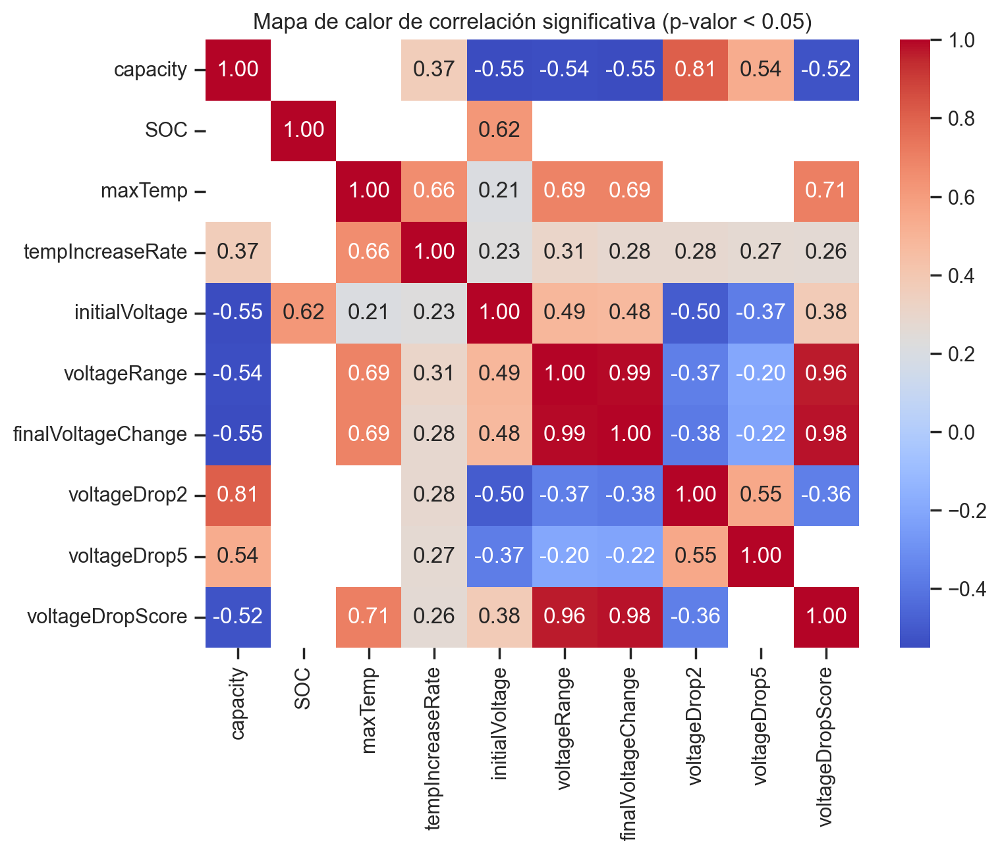

In [43]:
plt.figure(figsize=(8, 6))
sns.heatmap(significant_correlation, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Mapa de calor de correlación significativa (p-valor < 0.05)')
plt.show()

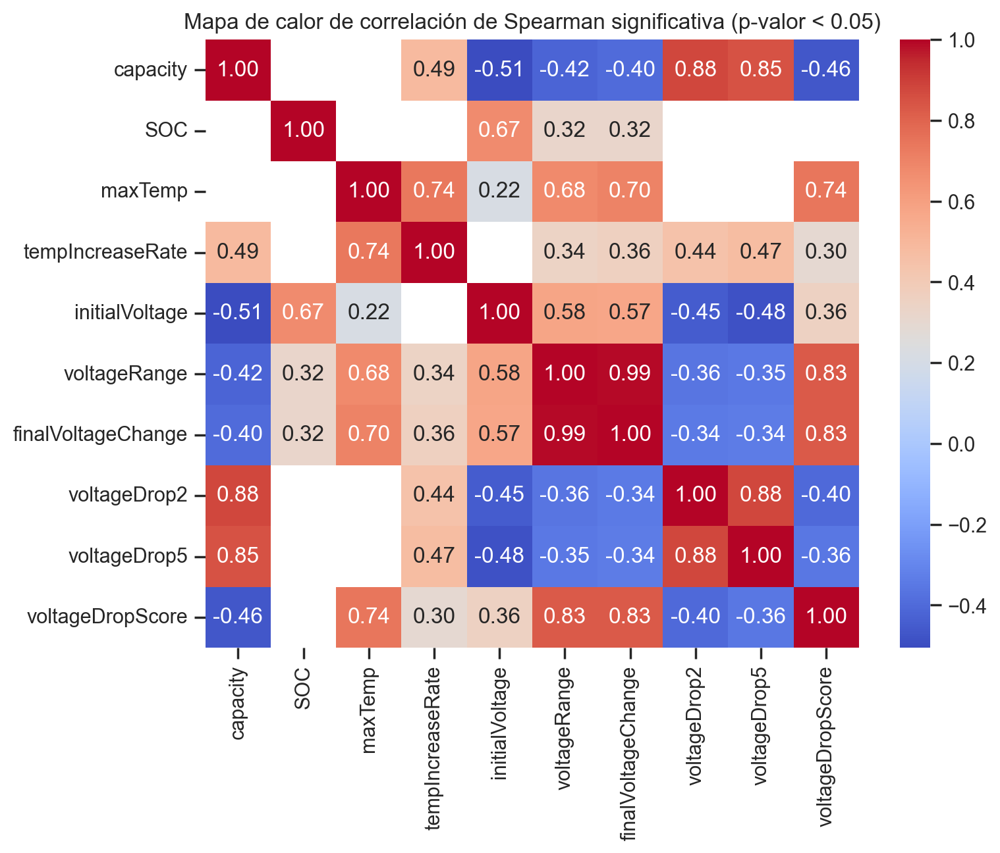

In [44]:
# Función para calcular la correlación de Spearman y filtrar por p-valor
def spearman_with_pvalues(df):
    columns = df.columns[1:-3]
    corr_matrix = pd.DataFrame(index=columns, columns=columns, dtype=float)
    p_values = pd.DataFrame(index=columns, columns=columns, dtype=float)
    
    for i in columns:
        for j in columns:
            corr, p_val = spearmanr(df[i], df[j])
            corr_matrix.loc[i, j] = corr
            p_values.loc[i, j] = p_val
    
    return corr_matrix, p_values

# Calcular la correlación de Spearman y los p-valores asociados
correlation, p_values = spearman_with_pvalues(df_data)

# Filtrar los valores de correlación por p-valor menor que 0.05
significant_correlation = correlation[p_values < 0.05]

# Crear un mapa de calor de la correlación significativa
plt.figure(figsize=(8, 6))
sns.heatmap(significant_correlation, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Mapa de calor de correlación de Spearman significativa (p-valor < 0.05)')
plt.show()

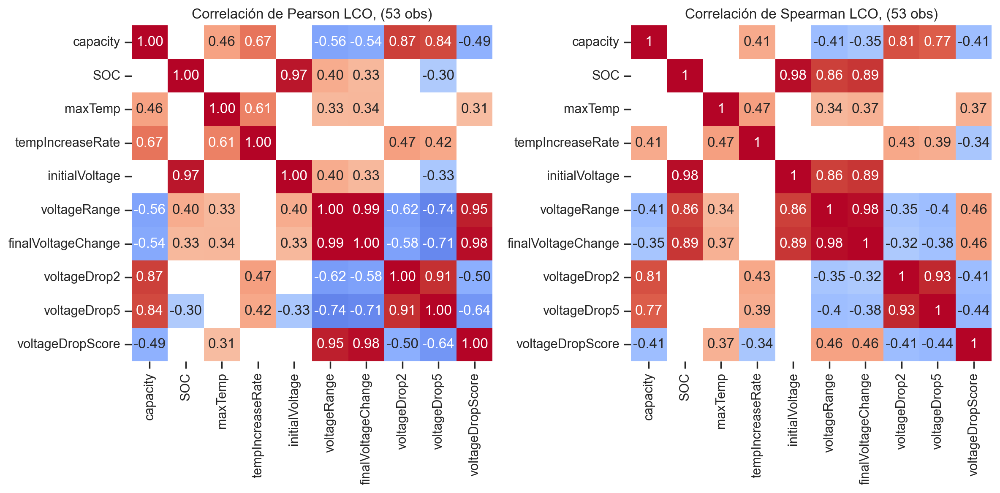

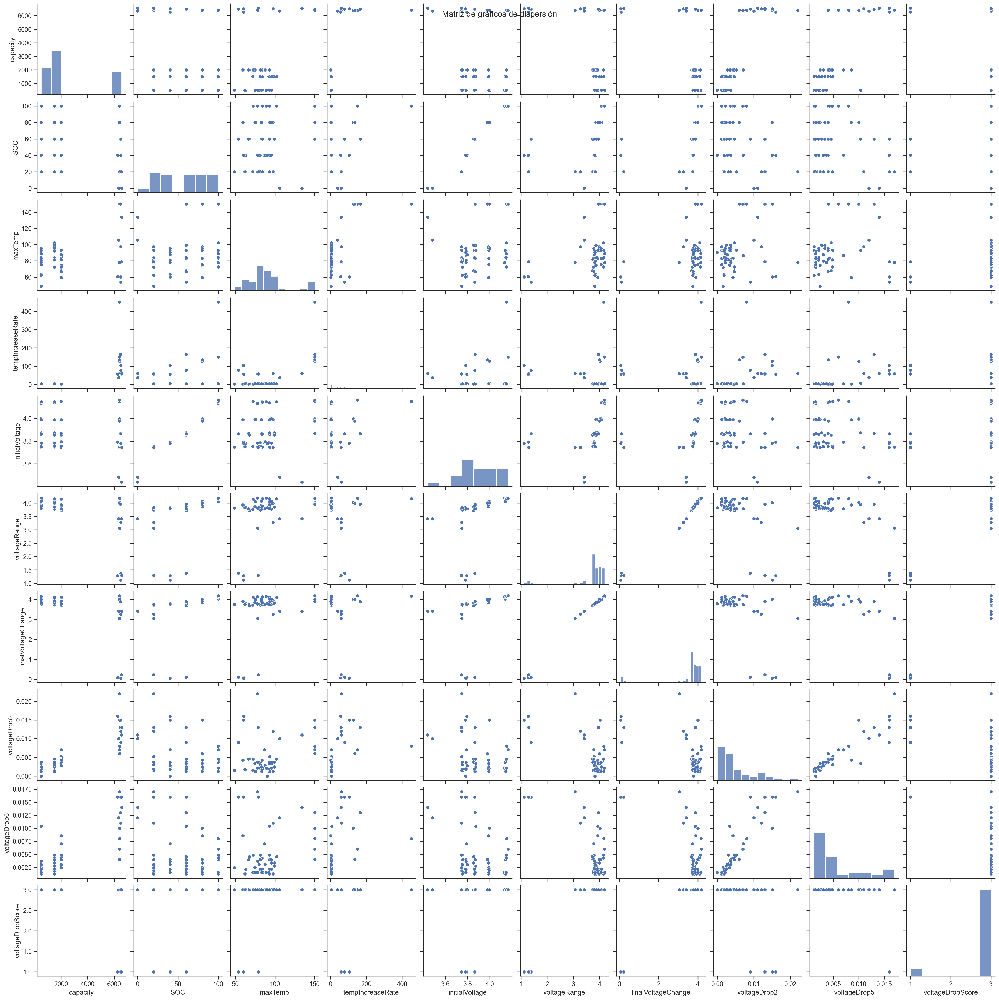

C:\Users\beca1\AppData\Local\Temp\ipykernel_10532\1702977824.py:40: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p_val = pearsonr(df[i], df[j])
C:\Users\beca1\AppData\Local\Temp\ipykernel_10532\2020862596.py:9: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p_val = spearmanr(df[i], df[j])


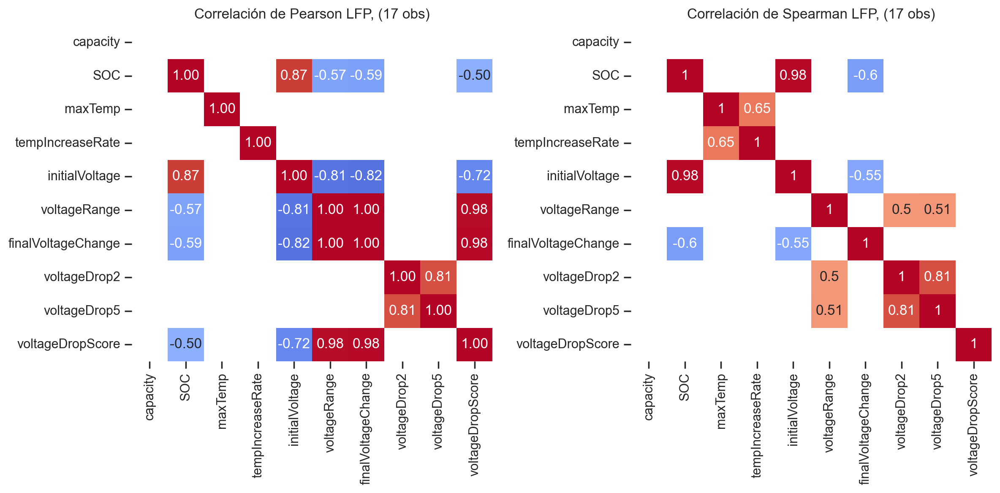

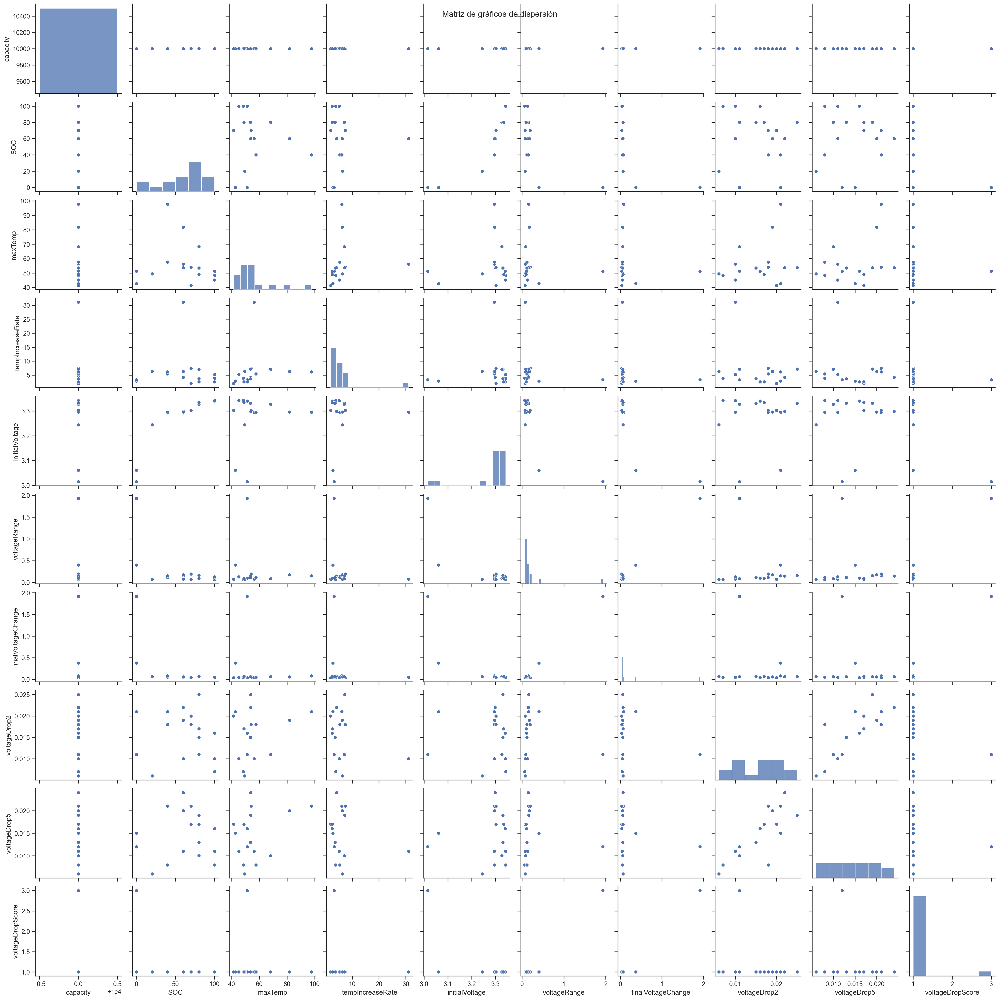

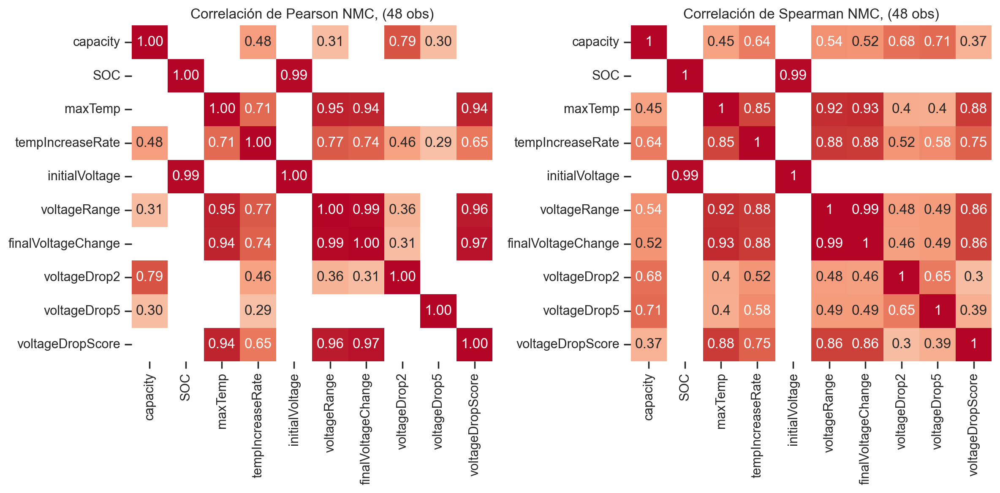

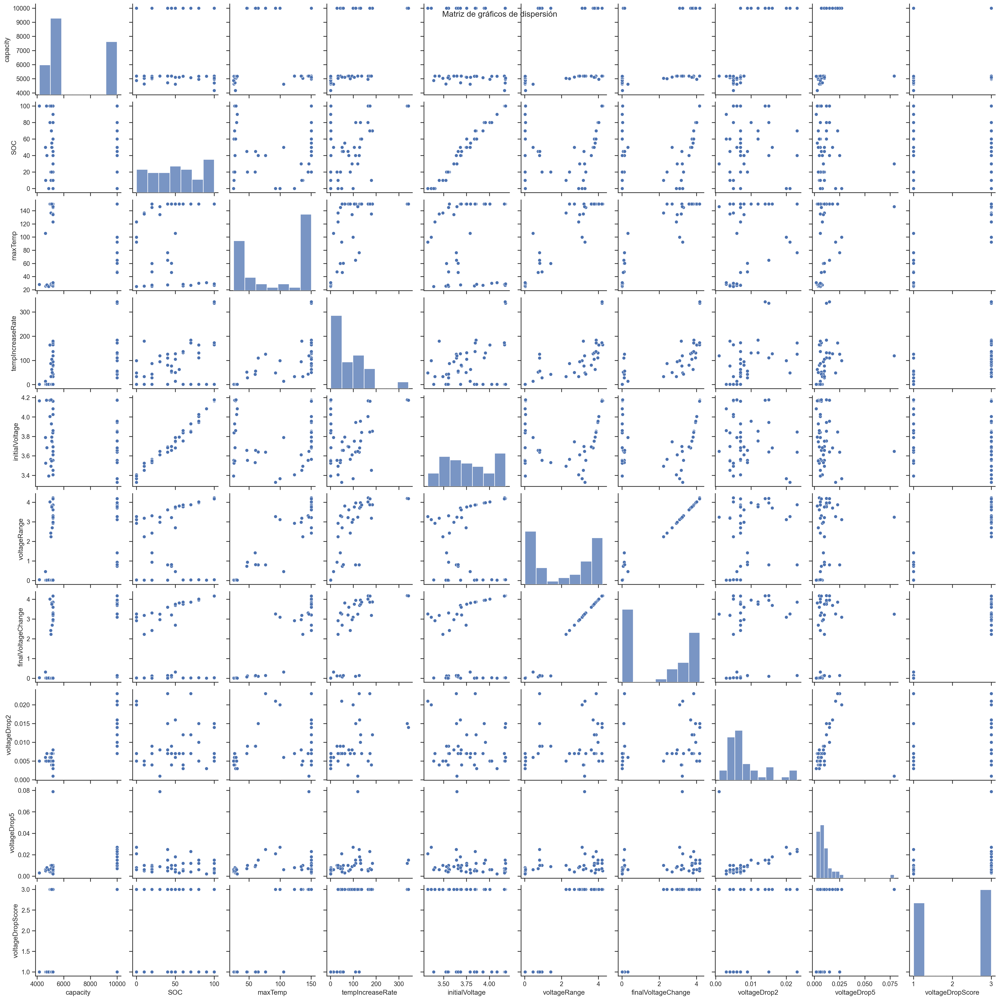

In [45]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

numeric_columns = df_data.columns[1:-3]

for i in np.unique(df_data.chemistry.values):
    # i='NMC'
    bat_quim = df_data[df_data.chemistry==i]
    
    # display(bat_quim[numeric_columns])
    
    # Calcular las correlaciones de Pearson y Spearman
    #
    # Calcular la correlación de Spearman y los p-valores asociados
    corr_pearson, p_values_pearson = pearson_with_pvalues(bat_quim)
    # Filtrar los valores de correlación por p-valor menor que 0.05
    significant_correlation_pearson = corr_pearson[p_values_pearson < 0.05]  
    #
    # Calcular la correlación de Spearman y los p-valores asociados
    corr_spearman, p_values_spearman = spearman_with_pvalues(bat_quim)
    # Filtrar los valores de correlación por p-valor menor que 0.05
    significant_correlation_spearman = corr_spearman[p_values_spearman < 0.05]  
    
    # display(corr_pearson, p_values_pearson, significant_correlation_pearson)
    # Mostrar las matrices de correlación
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    sns.heatmap(significant_correlation_pearson, annot=True, cmap='coolwarm', fmt=".2f", cbar=False, vmin=-1, vmax=1)
    plt.title(f"Correlación de Pearson {i}, ({len(bat_quim)} obs)")

    plt.subplot(1, 2, 2)
    sns.heatmap(significant_correlation_spearman, annot=True, cmap='coolwarm',cbar=False, vmin=-1, vmax=1) 
    plt.title(f"Correlación de Spearman {i}, ({len(bat_quim)} obs)")

    plt.tight_layout()
    plt.show()
    
    # Crear una matriz de gráficos de dispersión
    sns.pairplot(df_data[df_data.chemistry==i][numeric_columns])
    plt.suptitle('Matriz de gráficos de dispersión')
    plt.show()


-----------------------------------

In [46]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

numeric_columns = df_data.columns[1:-2]

def pearson_with_pvalues(df):
    corr_matrix = pd.DataFrame(index=numeric_columns, columns=numeric_columns, dtype=float)
    p_values = pd.DataFrame(index=numeric_columns, columns=numeric_columns, dtype=float)
    
    for i in numeric_columns:
        for j in numeric_columns:
            corr, p_val = pearsonr(df[i], df[j])
            corr_matrix.loc[i, j] = corr
            p_values.loc[i, j] = p_val
    
    return corr_matrix, p_values

# Función para calcular la correlación de Spearman y filtrar por p-valor
def spearman_with_pvalues(df):
    corr_matrix = pd.DataFrame(index=numeric_columns, columns=numeric_columns, dtype=float)
    p_values = pd.DataFrame(index=numeric_columns, columns=numeric_columns, dtype=float)
    
    for i in numeric_columns:
        for j in numeric_columns:
            corr, p_val = spearmanr(df[i], df[j])
            corr_matrix.loc[i, j] = corr
            p_values.loc[i, j] = p_val
    
    return corr_matrix, p_values

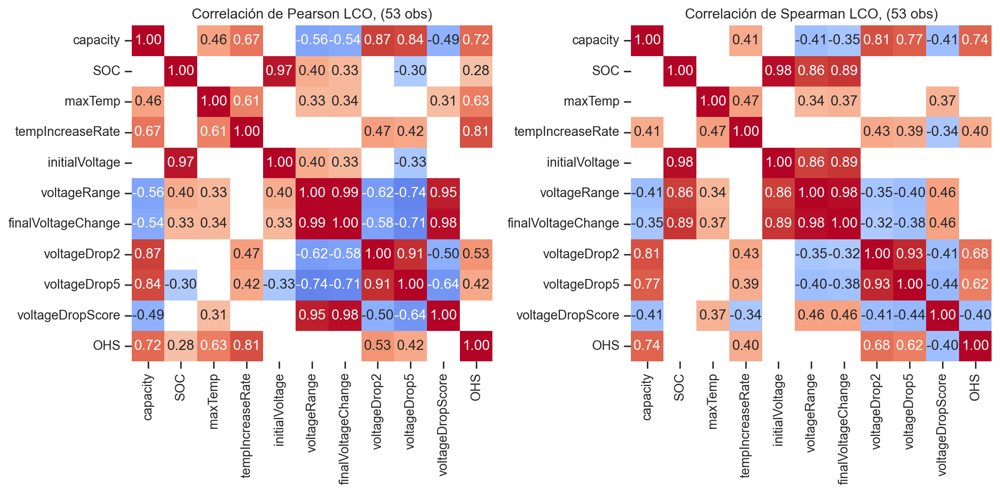

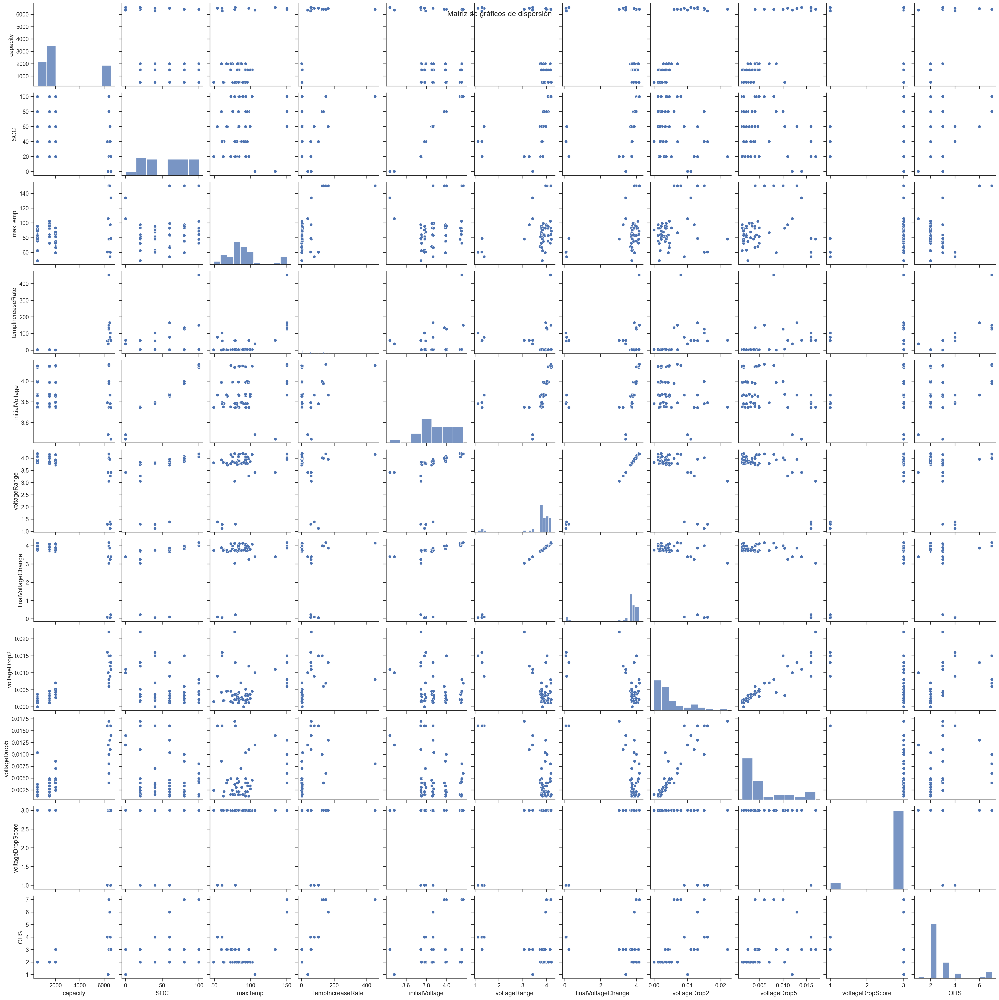

C:\Users\beca1\AppData\Local\Temp\ipykernel_10532\1053074241.py:13: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p_val = pearsonr(df[i], df[j])
C:\Users\beca1\AppData\Local\Temp\ipykernel_10532\1053074241.py:26: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p_val = spearmanr(df[i], df[j])


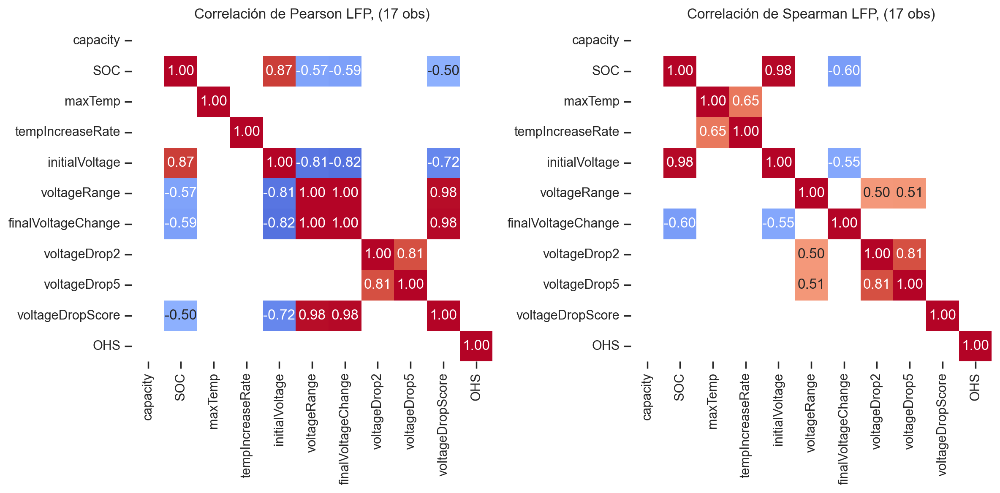

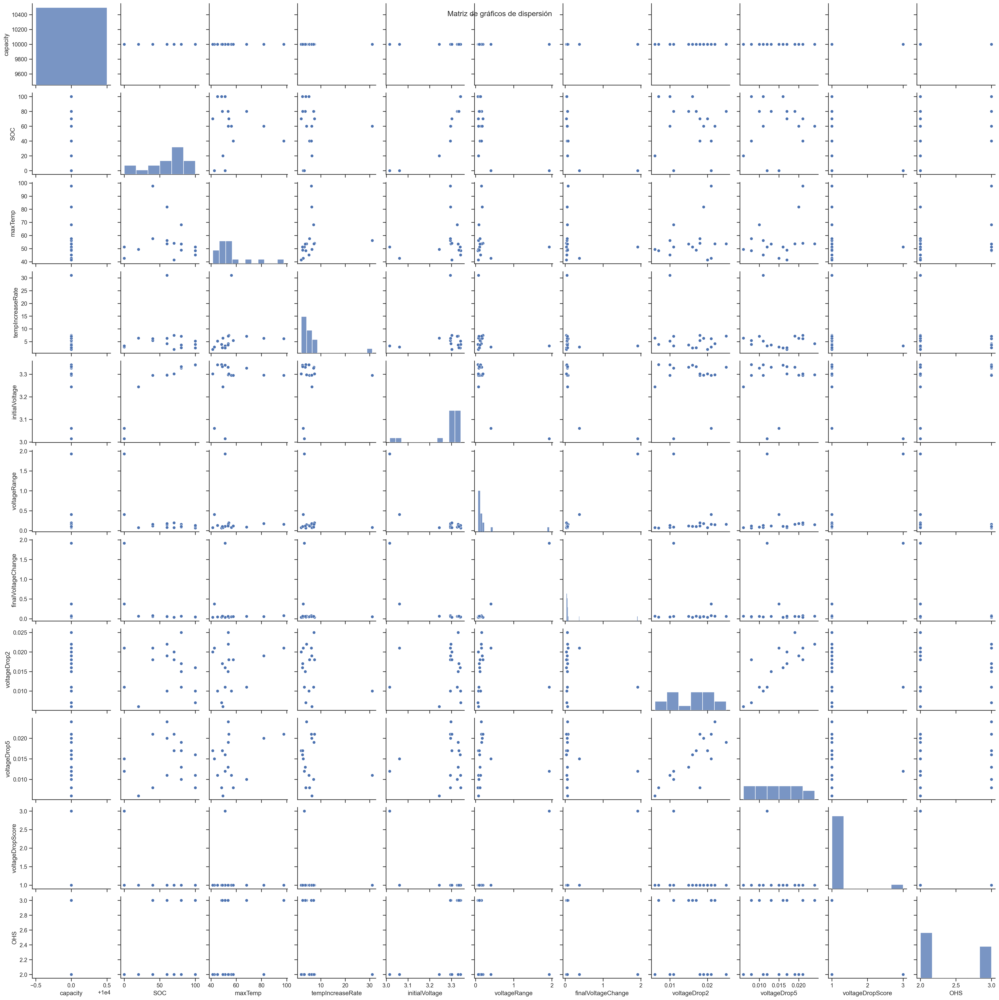

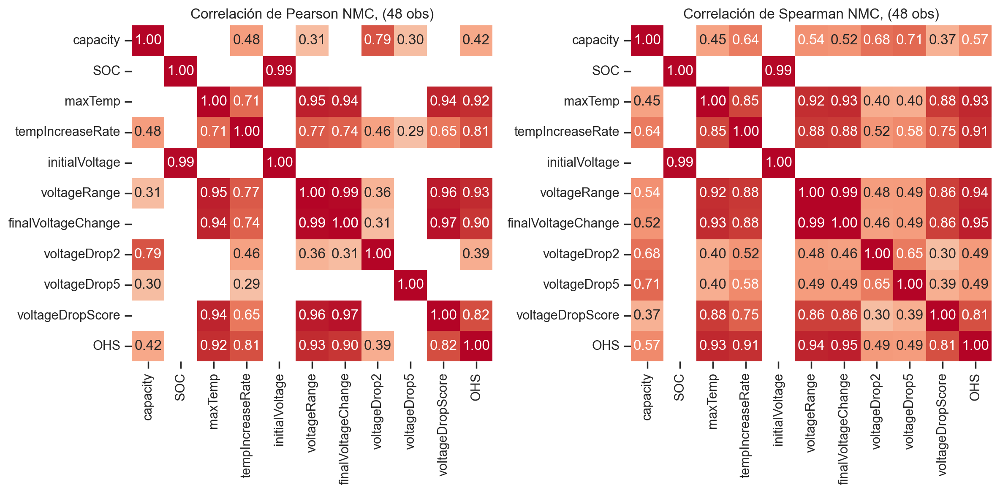

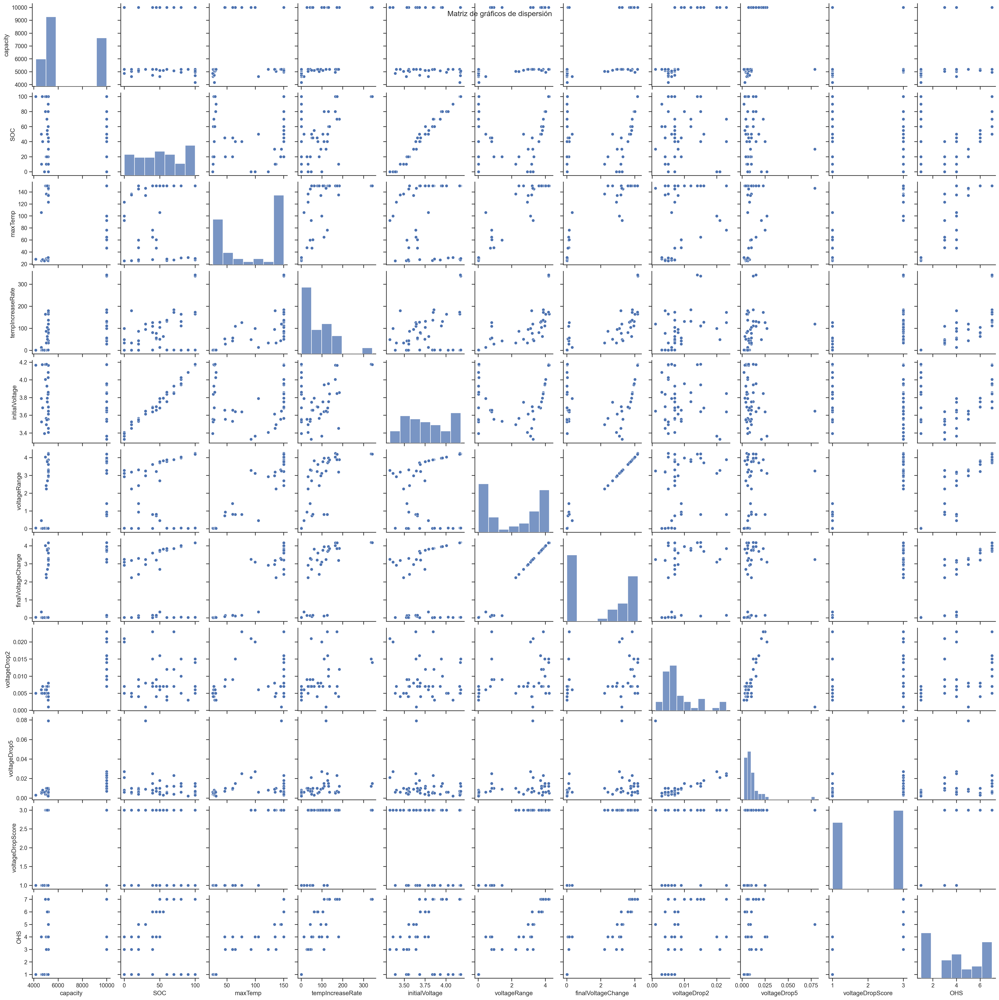

In [47]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

numeric_columns = df_data.columns[1:-2]

for i in np.unique(df_data.chemistry.values):
    # i='NMC'
    bat_quim = df_data[df_data.chemistry==i]
    
    # display(bat_quim[numeric_columns])
    
    # Calcular las correlaciones de Pearson y Spearman
    #
    # Calcular la correlación de Spearman y los p-valores asociados
    corr_pearson, p_values_pearson = pearson_with_pvalues(bat_quim)
    # Filtrar los valores de correlación por p-valor menor que 0.05
    significant_correlation_pearson = corr_pearson[p_values_pearson < 0.05]  
    #
    # Calcular la correlación de Spearman y los p-valores asociados
    corr_spearman, p_values_spearman = spearman_with_pvalues(bat_quim)
    # Filtrar los valores de correlación por p-valor menor que 0.05
    significant_correlation_spearman = corr_spearman[p_values_spearman < 0.05]  
    
    # display(corr_pearson, p_values_pearson, significant_correlation_pearson)
    # Mostrar las matrices de correlación
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    sns.heatmap(significant_correlation_pearson, annot=True, cmap='coolwarm', fmt=".2f", cbar=False, vmin=-1, vmax=1)
    plt.title(f"Correlación de Pearson {i}, ({len(bat_quim)} obs)")

    plt.subplot(1, 2, 2)
    sns.heatmap(significant_correlation_spearman, annot=True, cmap='coolwarm', fmt=".2f", cbar=False, vmin=-1, vmax=1)
    plt.title(f"Correlación de Spearman {i}, ({len(bat_quim)} obs)")

    plt.tight_layout()
    plt.show()
    
    # Crear una matriz de gráficos de dispersión
    sns.pairplot(df_data[df_data.chemistry==i][numeric_columns])
    plt.suptitle('Matriz de gráficos de dispersión')
    plt.show()


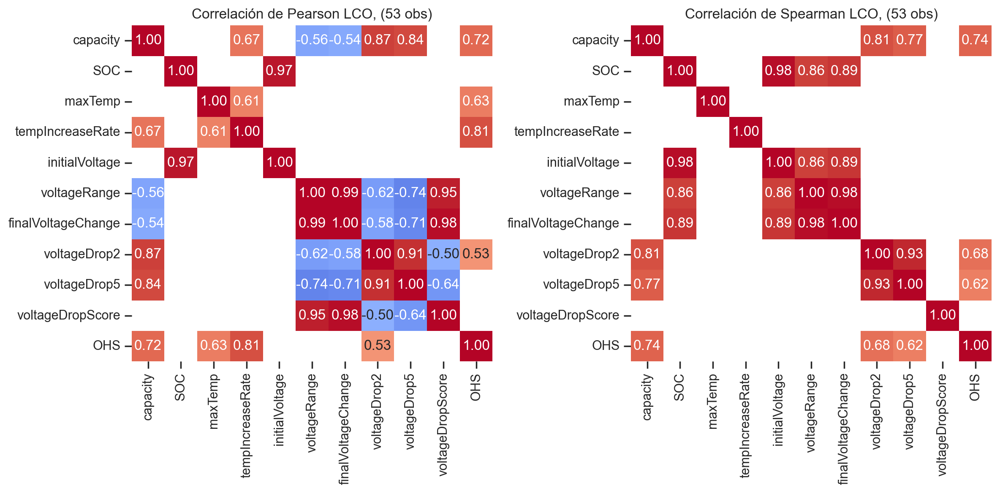

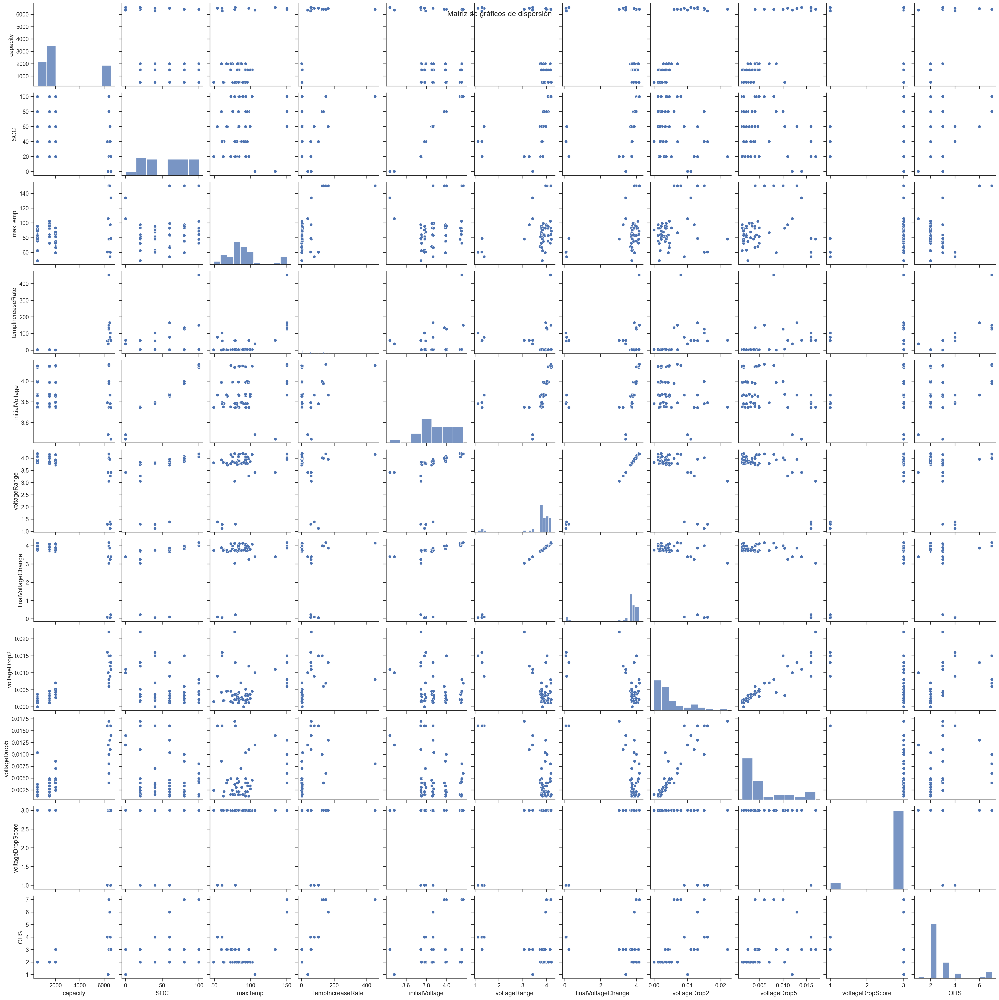

C:\Users\beca1\AppData\Local\Temp\ipykernel_10532\1053074241.py:13: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p_val = pearsonr(df[i], df[j])
C:\Users\beca1\AppData\Local\Temp\ipykernel_10532\1053074241.py:26: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p_val = spearmanr(df[i], df[j])


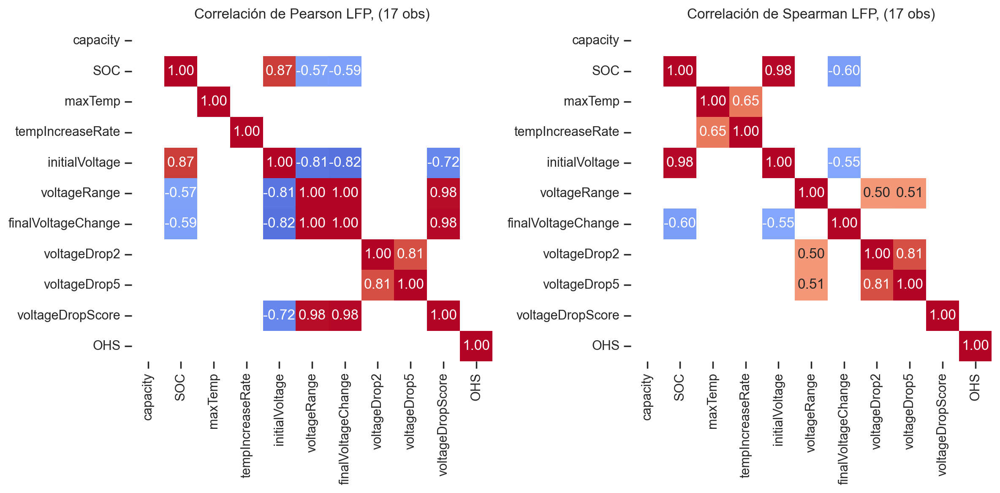

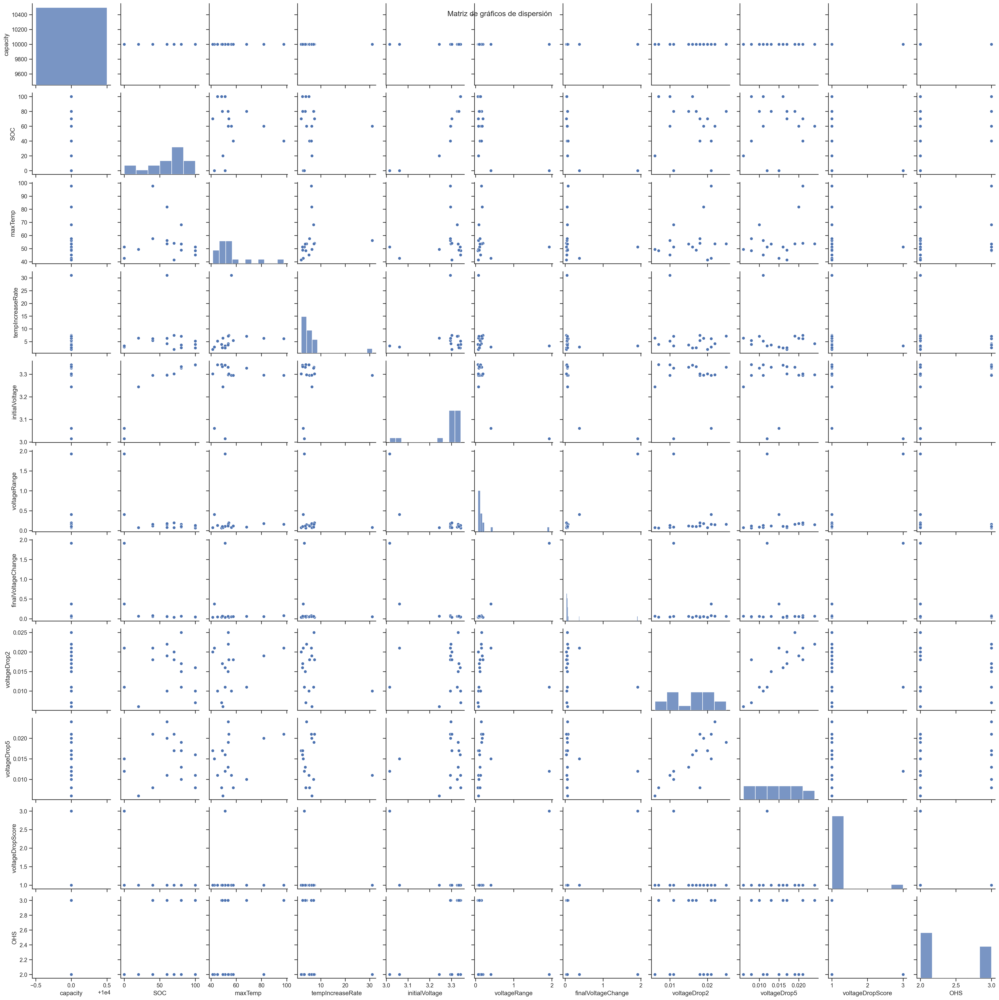

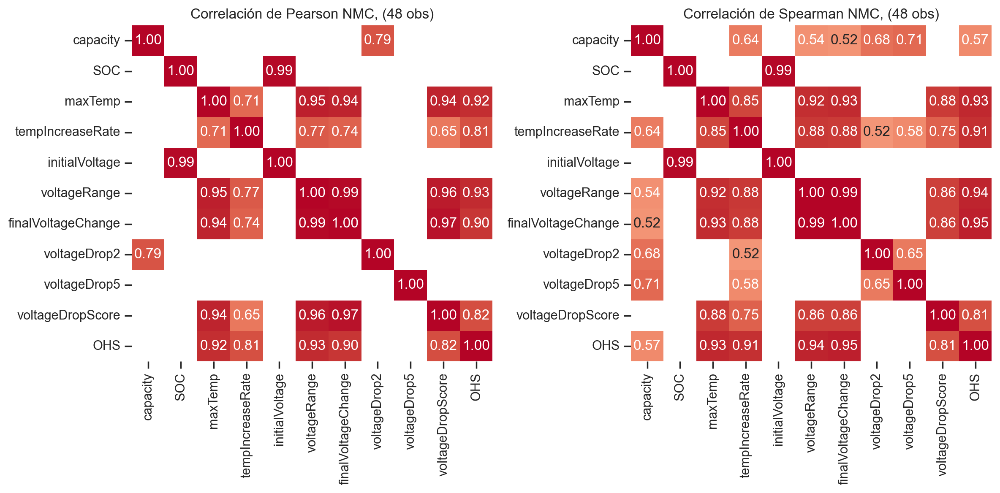

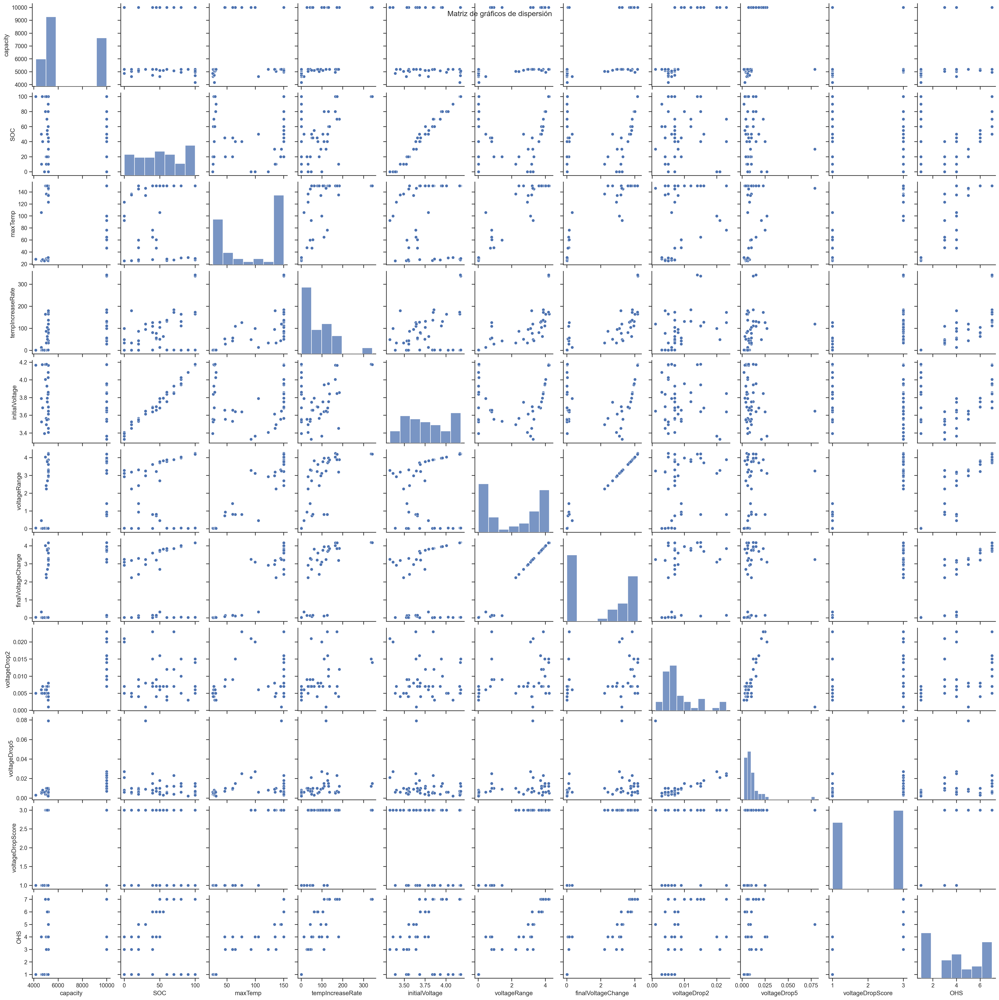

In [48]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

numeric_columns = df_data.columns[1:-2]

for i in np.unique(df_data.chemistry.values):
    # i='NMC'
    bat_quim = df_data[df_data.chemistry==i]
    
    # display(bat_quim[numeric_columns])
    
    # Calcular las correlaciones de Pearson y Spearman
    #
    # Calcular la correlación de Spearman y los p-valores asociados
    corr_pearson, p_values_pearson = pearson_with_pvalues(bat_quim)
    # Filtrar los valores de correlación por p-valor menor que 0.05
    significant_correlation_pearson = corr_pearson[(p_values_pearson < 0.05) & (abs(corr_pearson)>=0.5)]  
    #
    # Calcular la correlación de Spearman y los p-valores asociados
    corr_spearman, p_values_spearman = spearman_with_pvalues(bat_quim)
    # Filtrar los valores de correlación por p-valor menor que 0.05
    significant_correlation_spearman = corr_spearman[(p_values_spearman < 0.05) & (abs(corr_spearman)>=0.5)]  
    
    # display(corr_pearson, p_values_pearson, significant_correlation_pearson)
    # Mostrar las matrices de correlación
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    sns.heatmap(significant_correlation_pearson, annot=True, cmap='coolwarm', fmt=".2f", cbar=False, vmin=-1, vmax=1)
    plt.title(f"Correlación de Pearson {i}, ({len(bat_quim)} obs)")

    plt.subplot(1, 2, 2)
    sns.heatmap(significant_correlation_spearman, annot=True, cmap='coolwarm', fmt=".2f", cbar=False, vmin=-1, vmax=1)
    plt.title(f"Correlación de Spearman {i}, ({len(bat_quim)} obs)")

    plt.tight_layout()
    plt.show()
    
    # Crear una matriz de gráficos de dispersión
    sns.pairplot(df_data[df_data.chemistry==i][numeric_columns])
    plt.suptitle('Matriz de gráficos de dispersión')
    plt.show()


# GUARDAMOS IMÁGENES DE CORRELACIÓN Y MATRIZ DE DISPERSIÓN POR QUÍMICA

In [49]:
import os
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

numeric_columns = df_data.columns[1:-2]

# Carpeta base para guardar las gráficas
base_folder = "correlacion_por_quimica"

for i in np.unique(df_data.chemistry.values):
    # Crear una carpeta para la química de la batería si no existe
    quimica_folder = os.path.join(base_folder, i)
    os.makedirs(quimica_folder, exist_ok=True)

    # i='NMC'
    bat_quim = df_data[df_data.chemistry==i]
    
    # Calcular las correlaciones de Pearson y Spearman
    #
    # Calcular la correlación de Spearman y los p-valores asociados
    corr_pearson, p_values_pearson = pearson_with_pvalues(bat_quim)
    # Filtrar los valores de correlación por p-valor menor que 0.05
    significant_correlation_pearson = corr_pearson[(p_values_pearson < 0.05) & (abs(corr_pearson)>=0.5)]  
    #
    # Calcular la correlación de Spearman y los p-valores asociados
    corr_spearman, p_values_spearman = spearman_with_pvalues(bat_quim)
    # Filtrar los valores de correlación por p-valor menor que 0.05
    significant_correlation_spearman = corr_spearman[(p_values_spearman < 0.05) & (abs(corr_spearman)>=0.5)]  
    
    # Crear las subfiguras y guardarlas en la carpeta correspondiente
    fig, axes = plt.subplots(1, 2, figsize=(12, 6))
    sns.heatmap(significant_correlation_pearson, annot=True, cmap='coolwarm', fmt=".2f", cbar=False, vmin=-1, vmax=1, ax=axes[0])
    axes[0].set_title(f"Correlación de Pearson {i}, ({len(bat_quim)} obs)")
    sns.heatmap(significant_correlation_spearman, annot=True, cmap='coolwarm', fmt=".2f", cbar=False, vmin=-1, vmax=1, ax=axes[1])
    axes[1].set_title(f"Correlación de Spearman {i}, ({len(bat_quim)} obs)")
    plt.tight_layout()
    plt.savefig(os.path.join(quimica_folder, f"correlaciones_{i}.png"))

    # Crear el Pair Plot y guardarlo en la carpeta correspondiente
    pair_plot = sns.pairplot(df_data[df_data.chemistry==i][numeric_columns])
    pair_plot.fig.suptitle(f'Matriz de gráficos de dispersión {i}', y=1.02)
    plt.tight_layout()
    pair_plot.savefig(os.path.join(quimica_folder, f"pair_plot_{i}.png"))

    # Cerrar las figuras para liberar memoria
    plt.close("all")


C:\Users\beca1\AppData\Local\Temp\ipykernel_10532\1053074241.py:13: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p_val = pearsonr(df[i], df[j])
C:\Users\beca1\AppData\Local\Temp\ipykernel_10532\1053074241.py:26: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p_val = spearmanr(df[i], df[j])
